In [47]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.optim as optim
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import os
from torch.utils.data import DataLoader, Dataset
from torch.optim.lr_scheduler import StepLR
import time
import numpy as np

In [2]:
def display_prediction(path):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    img = Image.open(path)
    img = transform(img)

    axs[0].imshow(img.permute(1, 2, 0))
    axs[0].set_title('Tampered')
    axs[0].axis('off')

    img = img.unsqueeze(0)
    img = img.to(device)
    output = model(img, sobel(img))
    output = output.cpu().detach().numpy()[0].transpose(1, 2, 0)
    # plt.imshow(output, cmap='gray')

    axs[1].imshow(output, cmap='gray')
    axs[1].set_title('Predicted')
    axs[1].axis('off')

    # plt.imshow(img_tensor.permute(1, 2, 0))
    plt.show()

    print(output.shape)

In [3]:
def sobel(image):
    # Define the Sobel operator kernels
    sobel_kernel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32)
    sobel_kernel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32)

    sobel_kernel_x = sobel_kernel_x.view((1, 1, 3, 3))
    sobel_kernel_y = sobel_kernel_y.view((1, 1, 3, 3))

    # sobel_kernel_x = sobel_kernel_x.repeat(1, 3, 1, 1)
    # sobel_kernel_y = sobel_kernel_y.repeat(1, 3, 1, 1)

    if image.is_cuda:
        sobel_kernel_x = sobel_kernel_x.cuda()
        sobel_kernel_y = sobel_kernel_y.cuda()


    # Apply the Sobel operator
    filtered_image_x_r = F.conv2d(image[:, 0:1, :, :], sobel_kernel_x, padding=1)
    filtered_image_x_g = F.conv2d(image[:, 1:2, :, :], sobel_kernel_x, padding=1)
    filtered_image_x_b = F.conv2d(image[:, 2:3, :, :], sobel_kernel_x, padding=1)

    filtered_image_y_r = F.conv2d(image[:, 0:1, :, :], sobel_kernel_y, padding=1)
    filtered_image_y_g = F.conv2d(image[:, 1:2, :, :], sobel_kernel_y, padding=1)
    filtered_image_y_b = F.conv2d(image[:, 2:3, :, :], sobel_kernel_y, padding=1)

    residual_r = torch.sqrt(torch.square(filtered_image_x_r) + torch.square(filtered_image_y_r))
    residual_g = torch.sqrt(torch.square(filtered_image_x_g) + torch.square(filtered_image_y_g))
    residual_b = torch.sqrt(torch.square(filtered_image_x_b) + torch.square(filtered_image_y_b))

    filtered_image = torch.concat([residual_r, residual_g, residual_b], axis=1)

    filtered_image = filtered_image / torch.max(filtered_image)

    # Calculate the magnitude of the gradients
    # filtered_image = torch.sqrt(filtered_image_x**2 + filtered_image_y**2)

    # print("The Image Shape Is", filtered_image.shape)

    return filtered_image

In [ ]:
# Open the image file
img = Image.open('CASIA2Dataset/tp/Tp_D_CND_M_N_art00076_art00077_10289.jpg')

# Define the transformation
transform = transforms.Compose([
    transforms.ToTensor()
])

# Apply the transformation to the image
img_tensor = transform(img)

print("Tensor Shape", img_tensor.shape)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(img_tensor.permute(1, 2, 0))
axs[0].set_title('Tampered')
axs[0].axis('off')

img_tensor = sobel(img_tensor.unsqueeze(0))

axs[1].imshow(img_tensor.squeeze(0).permute(1, 2, 0))
axs[1].set_title('Residual')
axs[1].axis('off')

print(img_tensor.shape)

# plt.imshow(img_tensor.permute(1, 2, 0))
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'CASIA2Dataset/tp/Tp_D_CND_M_N_art00076_art00077_10289.jpg'

In [ ]:
img_tensor

NameError: name 'img_tensor' is not defined

In [4]:
# Define the model
class TamperedModel(nn.Module):
    def __init__(self):
        super(TamperedModel, self).__init__()

        # Define the layers
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(2, 2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(2, 2)

        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv7 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(2, 2)

        self.conv8 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv9 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv10 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool4 = nn.MaxPool2d(2, 2)

        self.conv11 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv12 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv13 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool5 = nn.MaxPool2d(2, 2)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        pool1_out = self.pool1(x)

        x = self.conv3(pool1_out)
        x = self.conv4(x)
        pool2_out = self.pool2(x)

        x = self.conv5(pool2_out)
        x = self.conv6(x)
        x = self.conv7(x)
        pool3_out = self.pool3(x)

        x = self.conv8(pool3_out)
        x = self.conv9(x)
        x = self.conv10(x)
        pool4_out = self.pool4(x)

        x = self.conv11(pool4_out)
        x = self.conv12(x)
        x = self.conv13(x)
        x = self.pool5(x)

        return x, pool1_out, pool2_out, pool3_out, pool4_out

In [5]:
# Define the model
class ResidualModel(nn.Module):
    def __init__(self):
        super(ResidualModel, self).__init__()

        # Define the layers
        self.conv1 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(8, 8, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(8, 8, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(8, 8, kernel_size=3, stride=2, padding=1)

        self.conv5 = nn.Conv2d(8, 16, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(16, 16, kernel_size=3, padding=1)
        self.conv7 = nn.Conv2d(16, 16, kernel_size=3, padding=1)
        self.conv8 = nn.Conv2d(16, 16, kernel_size=3, stride=2, padding=1)

        self.conv9 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.conv10 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.conv11 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.conv12 = nn.Conv2d(32, 32, kernel_size=3, stride=2, padding=1)

        self.conv13 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv14 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.conv15 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.conv16 = nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1)

        self.conv17 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv18 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.conv19 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.conv20 = nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1)

    def forward(self, x):
        conv1_out = self.conv1(x)
        conv2_out = self.conv2(conv1_out)
        conv3_out = self.conv3(conv2_out)
        multiplied1 = conv1_out + conv3_out
        conv4_out = self.conv4(multiplied1)

        conv5_out = self.conv5(conv4_out)
        conv6_out = self.conv6(conv5_out)
        conv7_out = self.conv7(conv6_out)
        multiplied2 = conv5_out + conv7_out
        conv8_out = self.conv8(multiplied2)

        conv9_out = self.conv9(conv8_out)
        conv10_out = self.conv10(conv9_out)
        conv11_out = self.conv11(conv10_out)
        multiplied3 = conv9_out + conv11_out
        conv12_out = self.conv12(multiplied3)

        conv13_out = self.conv13(conv12_out)
        conv14_out = self.conv14(conv13_out)
        conv15_out = self.conv15(conv14_out)
        multiplied4 = conv13_out + conv15_out
        conv16_out = self.conv16(multiplied4)

        conv17_out = self.conv17(conv16_out)
        conv18_out = self.conv18(conv17_out)
        conv19_out = self.conv19(conv18_out)
        multiplied5 = conv17_out + conv19_out
        output_right = self.conv20(multiplied5)

        return output_right

In [6]:
class DecoderModel(nn.Module):
    def __init__(self):
        super(DecoderModel, self).__init__()

        # Define the layers
        self.conv1 = nn.Conv2d(640, 256, kernel_size=3, padding=1, dilation=1)
        self.conv2 = nn.Conv2d(640, 256, kernel_size=3, padding=2, dilation=2)
        self.conv3 = nn.Conv2d(640, 256, kernel_size=3, padding=3, dilation=3)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv4 = nn.Conv2d(1280, 512, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(768, 256, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(384, 128, kernel_size=3, padding=1)
        self.conv7 = nn.Conv2d(192, 64, kernel_size=3, padding=1)
        self.conv8 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.conv9 = nn.Conv2d(64, 1, kernel_size=1, padding=0)
        self.batchnorm = nn.BatchNorm2d(1)

    def forward(self, output_left, output_right, conv_skip1, conv_skip2, conv_skip3, conv_skip4):
        # Concatenate the output of the encoders
        concat = torch.cat([output_left, output_right], dim=1)

        # Apply three dilations of the concatenation
        dialated_output1 = self.conv1(concat)
        dialated_output2 = self.conv2(concat)
        dialated_output3 = self.conv3(concat)

        # Concatenate and Upsample blocks
        concat = torch.cat([dialated_output1, dialated_output2, dialated_output3], dim=1)
        x = self.upsample(concat)

        # Skip 4
        x = torch.cat([self.crop(conv_skip4, x), x], dim=1)
        x = self.conv4(x)
        x = self.upsample(x)

        # Skip 3
        x = torch.cat([self.crop(conv_skip3, x), x], dim=1)
        x = self.conv5(x)
        x = self.upsample(x)

        # Skip 2
        x = torch.cat([self.crop(conv_skip2, x), x], dim=1)
        x = self.conv6(x)
        x = self.upsample(x)

        # Skip 1
        x = torch.cat([self.crop(conv_skip1, x), x], dim=1)
        x = self.conv7(x)
        x = self.upsample(x)

        # Final block
        x = self.conv8(x)
        x = self.conv9(x)
        x = self.batchnorm(x)
        x = torch.sigmoid(x)

        return x

    def crop(self, encFeatures, x):
      # grab the dimensions of the inputs, and crop the encoder
      # features to match the dimensions
      (_, _, H, W) = x.shape
      encFeatures = transforms.CenterCrop([H, W])(encFeatures)
      # return the cropped features
      return encFeatures

In [7]:
class DCUNet(nn.Module):
    def __init__(self):
        super(DCUNet, self).__init__()
        self.tamp = TamperedModel()
        self.resi = ResidualModel()
        self.decoder = DecoderModel()

    def forward(self, tampered_input, residual_input):
        tamp_out, pool1_out, pool2_out, pool3_out, pool4_out = self.tamp(tampered_input)
        resi_out = self.resi(residual_input)
        output = self.decoder(tamp_out, resi_out, pool1_out, pool2_out, pool3_out, pool4_out)
        return output

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cuda"
print(f"Using {device} device")

Using cpu device


In [9]:
model = DCUNet().to(device)

In [10]:
model

DCUNet(
  (tamp): TamperedModel(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv7): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv8): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv9): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 

In [ ]:
# # Open the image file
# img = Image.open('CASIA2Dataset/tp/Tp_D_CND_M_N_art00076_art00077_10289.jpg')

# # Define the transformation
# transform = transforms.Compose([
#     transforms.ToTensor()
# ])

# # Apply the transformation to the image
# img_tensor = transform(img)

# print("Tensor Shape", img_tensor.shape)

# res_img_tensor = sobel(img_tensor.unsqueeze(0))

# out = model(img_tensor.unsqueeze(0), res_img_tensor)

In [ ]:
# plt.imshow(out.permute(0, 2, 3, 1).detach().numpy()[0], cmap='gray')

In [ ]:
# BATCH_SIZE = 16
# train_size = 3868
# test_size = 400
# # Define the directories
# tampered_dir = "CASIA2Dataset/tp"
# ground_truth_dir = "CASIA2Dataset/gt"

# tampered_files = sorted([os.path.join(tampered_dir, f) for f in os.listdir(tampered_dir)])
# ground_truth_files = sorted([os.path.join(ground_truth_dir, f) for f in os.listdir(ground_truth_dir)])

# train_tampered_files = tampered_files[0:train_size]
# train_ground_truth_files = ground_truth_files[0:train_size]

# test_tampered_files = tampered_files[train_size:train_size+test_size]
# test_ground_truth_files = ground_truth_files[train_size:train_size+test_size]

# class CustomDataset(Dataset):
#     def __init__(self, tampered_files, ground_truth_files, transform=None):
#         self.tampered_files = tampered_files
#         self.ground_truth_files = ground_truth_files
#         self.transform = transform

#         self.tampered = []
#         self.sobel = []
#         self.ground_truth = []

#         transform_gray = transforms.Compose([
#             transforms.Grayscale()
#         ])

#         for i in self.ground_truth_files:
#             # ground_truth_image = Image.open(i)
#             ground_truth_image = plt.imread(i)
#             if len(ground_truth_image.shape) >= 3:
#               ground_truth_image = ground_truth_image[:, :, :3]
#             # print(ground_truth_image.shape)

#             # ground_truth_image = ground_truth_image.convert("L")

#             if self.transform:
#                 ground_truth_image = self.transform(ground_truth_image)
#             if ground_truth_image.shape[0] >= 3:
#                 ground_truth_image = transform_gray(ground_truth_image)

#             ground_truth_image = ground_truth_image / torch.max(ground_truth_image)

#             self.ground_truth.append(ground_truth_image)

#         for i in self.tampered_files:
#             # tampered_image = Image.open(i)
#             tampered_image = plt.imread(i)

#             if self.transform:
#                 tampered_image = self.transform(tampered_image)

#             tampered_image = tampered_image / torch.max(tampered_image)

#             self.tampered.append(tampered_image)
#             self.sobel.append(sobel(tampered_image.unsqueeze(0)).squeeze(0))

#     def __len__(self):
#         return len(self.tampered_files)

#     def __getitem__(self, idx):
# #         tampered_image = Image.open(self.tampered_files[idx])
# #         ground_truth_image = Image.open(self.ground_truth_files[idx])

# #         ground_truth_image = ground_truth_image.convert("RGB")

# #         # if ground_truth_image.mode == 'RGBA':

# #         #   r, g, b, a = ground_truth_image.split()

# #         #   # Convert the RGB channels to grayscale
# #         #   rgb_gray = Image.merge('RGB', (r, g, b)).convert('L')

# #         #   # Merge the grayscale image with the alpha channel
# #         #   ground_truth_image = Image.merge('LA', (rgb_gray, a))

# #         if self.transform:
# #             tampered_image = self.transform(tampered_image)
# #             ground_truth_image = self.transform(ground_truth_image)

# #         tampered_image = tampered_image / torch.max(tampered_image)
# #         ground_truth_image = ground_truth_image / torch.max(ground_truth_image)

# #         # ground_truth_image = ground_truth_image.expand(3, -1, -1)

#         return self.tampered[idx], self.sobel[idx], self.ground_truth[idx]

# transform = transforms.Compose([
#     # Add here the same transformations as in your `load_and_preprocess_image` function
#     transforms.ToTensor(),
#     transforms.Resize((256, 384)),
#     # transforms.Grayscale()
#     # transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
# ])


# train_dataset = CustomDataset(train_tampered_files, train_ground_truth_files, transform=transform)
# train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

# test_dataset = CustomDataset(test_tampered_files, test_ground_truth_files, transform=transform)
# test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)


In [18]:

class CustomDataset(Dataset):
    def __init__(self, tampered_files, ground_truth_files, transform=None):
        self.tampered_files = tampered_files
        self.ground_truth_files = ground_truth_files
        self.transform = transform

        self.tampered = []
        self.sobel = []
        self.ground_truth = []

        transform_gray = transforms.Compose([
            transforms.Grayscale()
        ])

        for i in self.ground_truth_files:
            # ground_truth_image = Image.open(i)
            ground_truth_image = plt.imread(i)
            if len(ground_truth_image.shape) >= 3:
              ground_truth_image = ground_truth_image[:, :, :3]
            # print(ground_truth_image.shape)

            # ground_truth_image = ground_truth_image.convert("L")

            if self.transform:
                ground_truth_image = self.transform(ground_truth_image)
            if ground_truth_image.shape[0] >= 3:
                ground_truth_image = transform_gray(ground_truth_image)

            ground_truth_image = ground_truth_image / torch.max(ground_truth_image)

            self.ground_truth.append(ground_truth_image)

        for i in self.tampered_files:
            # tampered_image = Image.open(i)
            tampered_image = plt.imread(i)

            if self.transform:
                tampered_image = self.transform(tampered_image)

            tampered_image = tampered_image / torch.max(tampered_image)

            self.tampered.append(tampered_image)
            self.sobel.append(sobel(tampered_image.unsqueeze(0)).squeeze(0))

    def __len__(self):
        return len(self.tampered_files)

    def __getitem__(self, idx):
#         tampered_image = Image.open(self.tampered_files[idx])
#         ground_truth_image = Image.open(self.ground_truth_files[idx])

#         ground_truth_image = ground_truth_image.convert("RGB")

#         # if ground_truth_image.mode == 'RGBA':

#         #   r, g, b, a = ground_truth_image.split()

#         #   # Convert the RGB channels to grayscale
#         #   rgb_gray = Image.merge('RGB', (r, g, b)).convert('L')

#         #   # Merge the grayscale image with the alpha channel
#         #   ground_truth_image = Image.merge('LA', (rgb_gray, a))

#         if self.transform:
#             tampered_image = self.transform(tampered_image)
#             ground_truth_image = self.transform(ground_truth_image)

#         tampered_image = tampered_image / torch.max(tampered_image)
#         ground_truth_image = ground_truth_image / torch.max(ground_truth_image)

#         # ground_truth_image = ground_truth_image.expand(3, -1, -1)

        return self.tampered[idx], self.sobel[idx], self.ground_truth[idx]

transform = transforms.Compose([
    # Add here the same transformations as in your `load_and_preprocess_image` function
    transforms.ToTensor(),
    transforms.Resize((256, 384)),
    # transforms.Grayscale()
    # transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

train_loader = torch.load("TrainLoader3868.pth")
test_loader = torch.load("TestLoader400y.pth")

torch.Size([16, 1, 256, 384])
torch.Size([3, 256, 384])
torch.Size([3, 256, 384])
torch.Size([1, 256, 384])


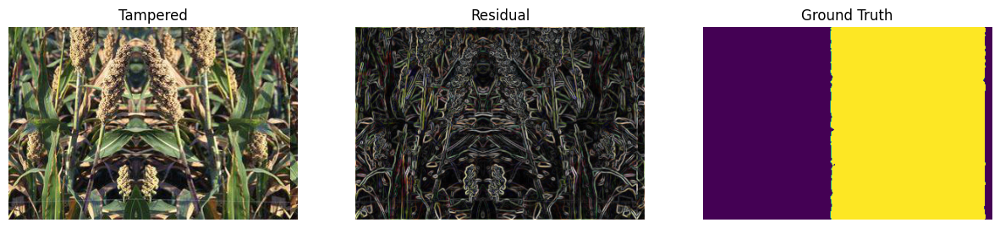

In [ ]:
pos = 15
for i in train_loader:
# for count, i in tqdm(enumerate(test_loader), total=len(test_loader)):
  print(i[2].shape)
  # plt.imshow(i[0][0].permute(1, 2, 0))

  # i = 1

  print(i[0][pos].shape)
  print(i[1][pos].shape)
  print(i[2][pos].shape)

  a, axs = plt.subplots(1, 3, figsize=(15, 3))

  axs[0].imshow(i[0][pos].permute(1, 2, 0))
  axs[0].set_title("Tampered")
  axs[0].axis("off")

  axs[1].imshow(i[1][pos].permute(1, 2, 0))
  axs[1].set_title("Residual")
  axs[1].axis("off")

  axs[2].imshow(i[2][pos].permute(1, 2, 0))
  axs[2].set_title("Ground Truth")
  axs[2].axis("off")

  plt.show()
  break

In [ ]:
# i = 1

# a, axs = plt.subplots(1, 3, figsize=(15, 3))

# axs[0].imshow(train_dataset[i][0].permute(1, 2, 0))
# axs[0].set_title("Tampered")
# axs[0].axis("off")

# axs[1].imshow(train_dataset[i][1].permute(1, 2, 0))
# axs[1].set_title("Residual")
# axs[1].axis("off")

# axs[2].imshow(train_dataset[i][2].permute(1, 2, 0), cmap='gray')
# axs[2].set_title("Ground Truth")
# axs[2].axis("off")

# plt.show()

# print(train_dataset[i][2].permute(1, 2, 0).shape)

In [ ]:
def dice_loss(y_true, y_pred):
    # Binary cross-entropy loss
    bce_loss = F.binary_cross_entropy_with_logits(y_true, y_pred)

    # Dice loss
    numerator = 2 * torch.sum(y_true * y_pred)
#     print("NNNNN", numerator)
    denominator = torch.sum(y_true * y_true) + torch.sum(y_pred * y_pred)
#     print("DDDDD", denominator)
    dice_loss = 1 - (numerator / denominator)
#     print("DICE", dice_loss)

    # Weighted combination
    w = 0.01  # Set your desired weight
#     dice_loss = dice_loss.unsqueeze(dim=-1)
    combined_loss = w * bce_loss + dice_loss

    return combined_loss

In [ ]:
# loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [ ]:
# Define your scheduler
scheduler = StepLR(optimizer, step_size=100, gamma=0.1)

NameError: name 'optimizer' is not defined

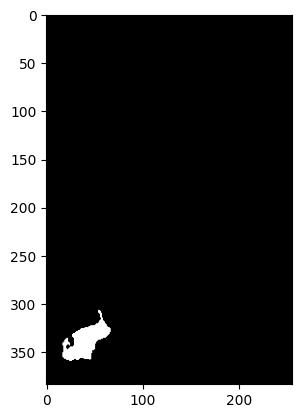

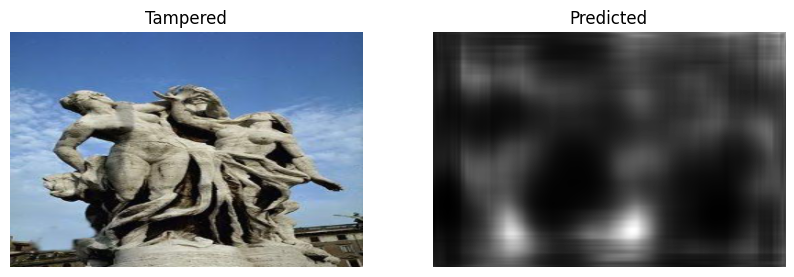

(256, 384, 1)


In [ ]:
path = "CASIA2Dataset/tp/Tp_S_NRN_S_O_arc00021_arc00021_01119.jpg"
plt.imshow(plt.imread("CASIA2Dataset/gt/Tp_S_NRN_S_O_arc00021_arc00021_01119_gt.png"), cmap='gray')
display_prediction(path)

torch.Size([16, 1, 256, 384])
torch.Size([3, 256, 384])
torch.Size([3, 256, 384])
torch.Size([1, 256, 384])


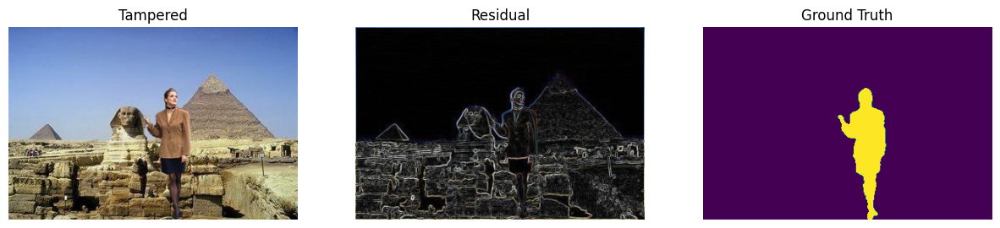

torch.Size([1, 1, 256, 384]) torch.Size([1, 256, 384])
tensor(0.8378, device='cuda:0', grad_fn=<AddBackward0>)


In [ ]:
pos = 15
tp = res = gt = None
for i in train_loader:
# for count, i in tqdm(enumerate(test_loader), total=len(test_loader)):
  print(i[2].shape)
  # plt.imshow(i[0][0].permute(1, 2, 0))

  # i = 1
    
  print(i[0][pos].shape)
  tp = i[0][pos]
  print(i[1][pos].shape)
  res = i[1][pos]
  print(i[2][pos].shape)
  gt = i[2][pos]

  a, axs = plt.subplots(1, 3, figsize=(15, 3))

  axs[0].imshow(i[0][pos].permute(1, 2, 0))
  axs[0].set_title("Tampered")
  axs[0].axis("off")

  axs[1].imshow(i[1][pos].permute(1, 2, 0))
  axs[1].set_title("Residual")
  axs[1].axis("off")

  axs[2].imshow(i[2][pos].permute(1, 2, 0))
  axs[2].set_title("Ground Truth")
  axs[2].axis("off")

  plt.show()
  break

out = model(tp.unsqueeze(0).to(device), res.unsqueeze(0).to(device))
print(out.shape, gt.shape)
loss_value = dice_loss(gt.to(device), out[0])
# plt.imshow(out.cpu().detach().numpy()[0].transpose(1, 2, 0), cmap='gray')
print(loss_value)

In [ ]:
def train(model, trainloader, optimizer, loss_fn):
    model.train()
    print('Training')
    train_running_loss = 0.0
    train_running_correct = 0
    counter = 0
    correct_pixels = 0
    total_pixels = 0
#     for i, data in tqdm(enumerate(trainloader), total=len(trainloader)):
    for data in trainloader:
        counter += 1
        tampered, residual, ground_truth = data
        tampered = tampered.to(device)
        residual = residual.to(device)
        ground_truth = ground_truth.to(device)

#         weights = torch.tensor([0.2989, 0.5870, 0.1140]).view(1, 3, 1, 1).to(device)

        # Use the weights to convert to grayscale
#         ground_truth = (ground_truth * weights).sum(dim=1, keepdim=True)

        optimizer.zero_grad()
        # forward pass
        outputs = model(tampered, residual)
        # calculate the loss
        loss = dice_loss(ground_truth, outputs)
#         loss_mean = loss.mean()
        train_running_loss += loss
        # calculate the accuracy
#         preds = torch.argmax(outputs, dim=1)
#         compare = (preds == ground_truth)
#         print(outputs.shape, ground_truth.shape, preds.shape, compare.shape)
        
        # calculate the accuracy
        preds = (outputs > 0.5).float()  # Threshold the output probabilities to get binary predictions
        compare = (preds == ground_truth)
        correct_pixels += torch.sum(compare).item()
        total_pixels += torch.numel(ground_truth)
#         print(outputs.shape, ground_truth.shape, preds.shape, compare.shape)
        
        
#         correct_pixels = torch.sum(preds == ground_truth).item()
#         total_pixels = torch.numel(ground_truth)
        train_running_correct += 100.0 * (correct_pixels / total_pixels)
#         print(correct_pixels, total_pixels, train_running_correct)
#         # Assuming 'preds' is your model's predicted output and 'labels' is the ground truth
#         correct_preds = (outputs == ground_truth).float()  # This will give a binary mask of correctly classified pixels
#         accuracy = correct_preds.sum() / correct_preds.numel()  # This calculates the accuracy
#         train_running_correct += accuracy
#         print(accuracy)

        # backpropagation
        loss.backward()
        # update the optimizer parameters
        optimizer.step()
        # break
        print('|', end="")

    # loss and accuracy for the complete epoch
    epoch_loss = train_running_loss / counter
    epoch_acc = train_running_correct / counter
    return epoch_loss, epoch_acc

In [ ]:
# validation Of Model
def validate(model, testloader, loss_fn):
    model.eval()
    valid_running_loss = 0.0
    test_running_correct = 0.0
    correct_pixels = 0
    total_pixels = 0
    counter = 0
    with torch.no_grad():
#         for i, data in tqdm(enumerate(testloader), total=len(testloader)):
        for data in testloader:
            counter += 1
            tampered, residual, ground_truth = data
            tampered = tampered.to(device)
            residual = residual.to(device)
            ground_truth = ground_truth.to(device)
#             weights = torch.tensor([0.2989, 0.5870, 0.1140]).view(1, 3, 1, 1).to(device)
            # Use the weights to convert to grayscale
#             ground_truth = (ground_truth * weights).sum(dim=1, keepdim=True)
#             ground_truth = ground_truth / torch.max(ground_truth)
            outputs = model(tampered, residual)
            loss = dice_loss(ground_truth, outputs)
            valid_running_loss += loss
            
            preds = (outputs > 0.5).float()  # Threshold the output probabilities to get binary predictions
            compare = (preds == ground_truth)
            correct_pixels += torch.sum(compare).item()
            total_pixels += torch.numel(ground_truth)
        
#             preds = torch.argmax(outputs, dim=1) 
#             correct_pixels = torch.sum(preds == ground_truth).item()
#             total_pixels = torch.numel(ground_truth)
            test_running_correct += 100.0 * (correct_pixels / total_pixels)

#             correct_preds = (outputs == ground_truth).float()  # This will give a binary mask of correctly classified pixels
#             accuracy = correct_preds.sum() / correct_preds.numel()  # This calculates the accuracy
#             test_running_correct += accuracy
#             print(correct_preds, accuracy, test_running_correct)
        
            print('+', end="")

    epoch_loss = valid_running_loss / counter
    epoch_acc = test_running_correct / counter
    return epoch_loss, epoch_acc

[INFO]: Epoch 1 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.726, training acc: 55.269
Validation loss: 0.882, validation acc: 70.109
Time =  70.25523376464844
--------------------------------------------------


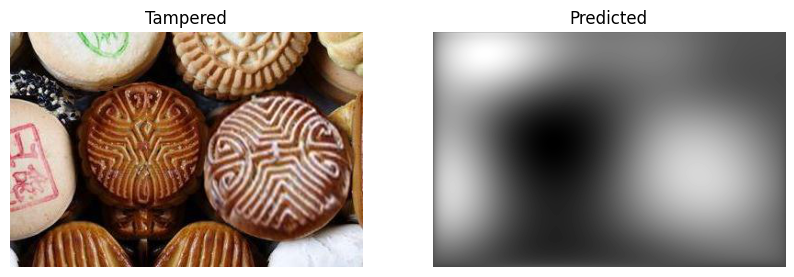

(256, 384, 1)
[INFO]: Epoch 2 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.711, training acc: 60.706
Validation loss: 0.879, validation acc: 74.418
Time =  129.70325803756714
--------------------------------------------------
[INFO]: Epoch 3 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.710, training acc: 63.860
Validation loss: 0.887, validation acc: 62.642
Time =  227.63986444473267
--------------------------------------------------
[INFO]: Epoch 4 of 300
Training
||||||||||||||||||

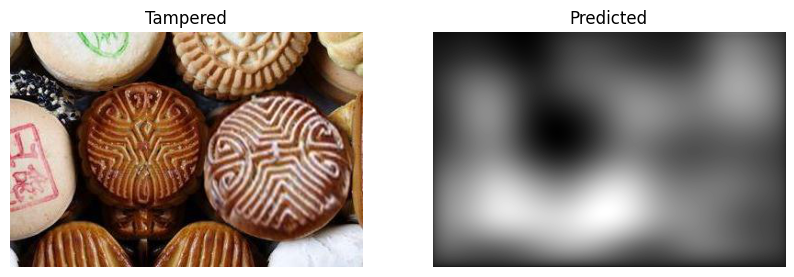

(256, 384, 1)
[INFO]: Epoch 12 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.679, training acc: 77.473
Validation loss: 0.864, validation acc: 78.456
Time =  800.9505703449249
--------------------------------------------------
[INFO]: Epoch 13 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.677, training acc: 78.184
Validation loss: 0.864, validation acc: 80.869
Time =  885.849366903305
--------------------------------------------------
[INFO]: Epoch 14 of 300
Training
||||||||||||||||||

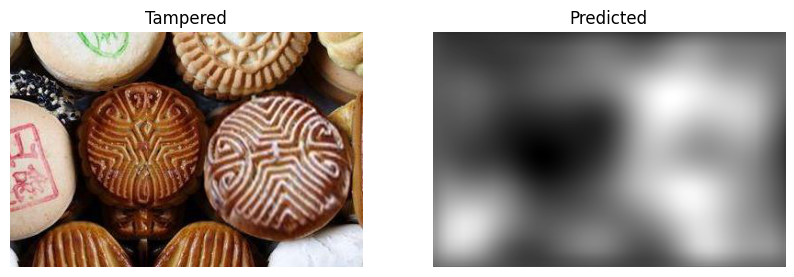

(256, 384, 1)
[INFO]: Epoch 22 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.664, training acc: 79.372
Validation loss: 0.859, validation acc: 79.398
Time =  1727.0412278175354
--------------------------------------------------
[INFO]: Epoch 23 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.664, training acc: 79.621
Validation loss: 0.851, validation acc: 87.120
Time =  1830.804535150528
--------------------------------------------------
[INFO]: Epoch 24 of 300
Training
||||||||||||||||

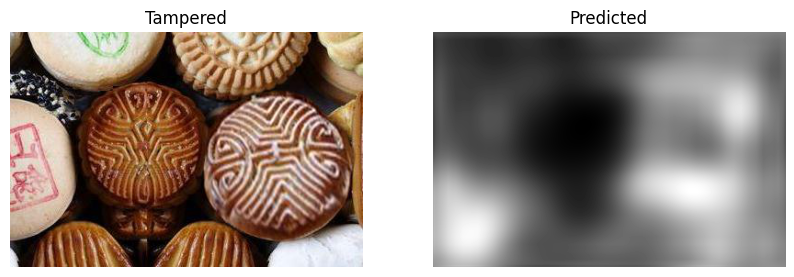

(256, 384, 1)
[INFO]: Epoch 32 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.642, training acc: 81.342
Validation loss: 0.847, validation acc: 85.691
Time =  2796.466486930847
--------------------------------------------------
[INFO]: Epoch 33 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.642, training acc: 81.848
Validation loss: 0.855, validation acc: 78.422
Time =  2904.918216943741
--------------------------------------------------
[INFO]: Epoch 34 of 300
Training
|||||||||||||||||

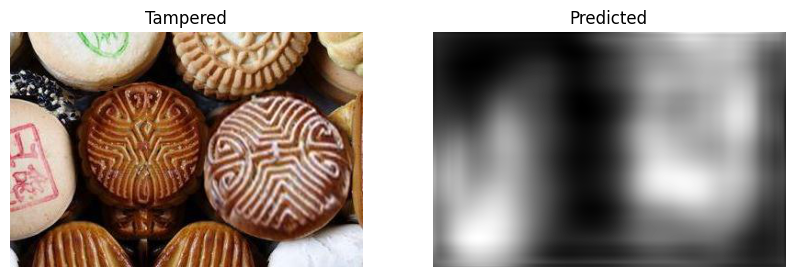

(256, 384, 1)
[INFO]: Epoch 42 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.607, training acc: 82.744
Validation loss: 0.851, validation acc: 79.261
Time =  4088.209174633026
--------------------------------------------------
[INFO]: Epoch 43 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.599, training acc: 82.839
Validation loss: 0.855, validation acc: 74.442
Time =  4213.918281316757
--------------------------------------------------
[INFO]: Epoch 44 of 300
Training
|||||||||||||||||

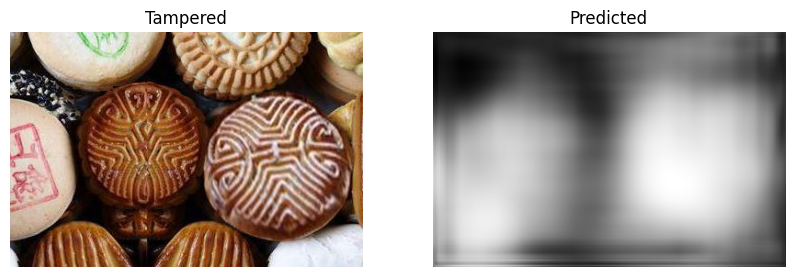

(256, 384, 1)
[INFO]: Epoch 52 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.533, training acc: 86.482
Validation loss: 0.857, validation acc: 80.455
Time =  5263.681976079941
--------------------------------------------------
[INFO]: Epoch 53 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.529, training acc: 87.048
Validation loss: 0.856, validation acc: 88.951
Time =  5365.345321416855
--------------------------------------------------
[INFO]: Epoch 54 of 300
Training
|||||||||||||||||

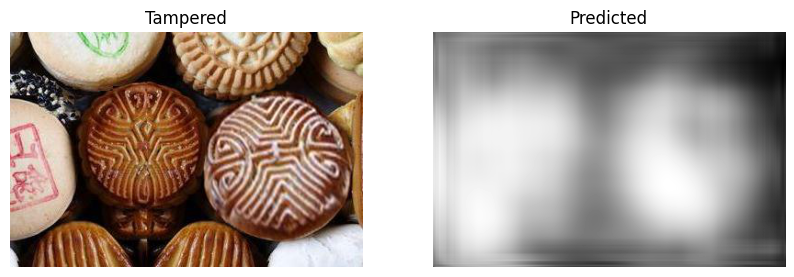

(256, 384, 1)
[INFO]: Epoch 62 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.444, training acc: 90.099
Validation loss: 0.845, validation acc: 88.230
Time =  6274.066311120987
--------------------------------------------------
[INFO]: Epoch 63 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.443, training acc: 90.178
Validation loss: 0.838, validation acc: 83.679
Time =  6368.697849750519
--------------------------------------------------
[INFO]: Epoch 64 of 300
Training
|||||||||||||||||

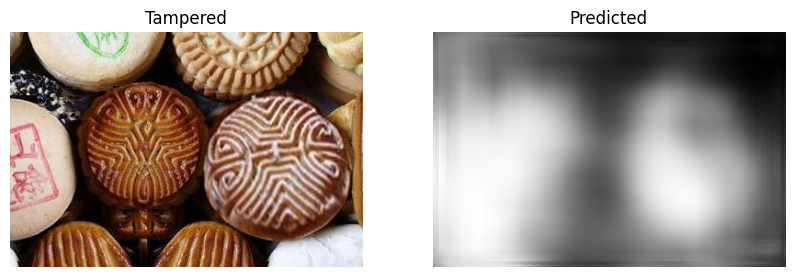

(256, 384, 1)
[INFO]: Epoch 72 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.382, training acc: 92.649
Validation loss: 0.842, validation acc: 82.409
Time =  7266.3255796432495
--------------------------------------------------
[INFO]: Epoch 73 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.372, training acc: 92.397
Validation loss: 0.855, validation acc: 91.787
Time =  7350.1284165382385
--------------------------------------------------
[INFO]: Epoch 74 of 300
Training
|||||||||||||||

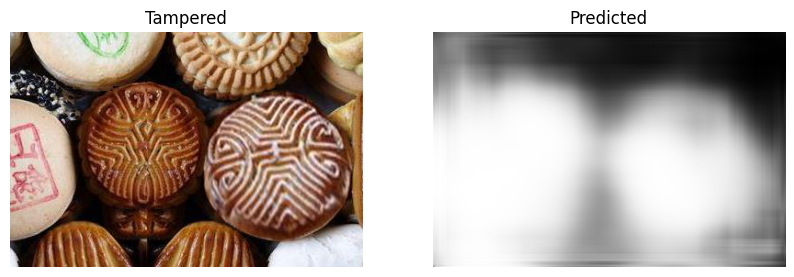

(256, 384, 1)
[INFO]: Epoch 82 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.318, training acc: 94.009
Validation loss: 0.825, validation acc: 88.518
Time =  8123.8289704322815
--------------------------------------------------
[INFO]: Epoch 83 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.312, training acc: 94.277
Validation loss: 0.834, validation acc: 87.990
Time =  8199.99015879631
--------------------------------------------------
[INFO]: Epoch 84 of 300
Training
|||||||||||||||||

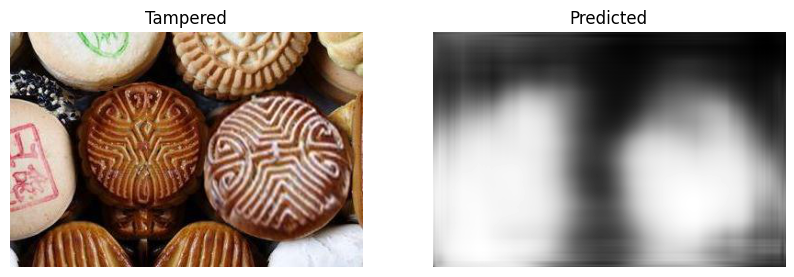

(256, 384, 1)
[INFO]: Epoch 92 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.272, training acc: 95.325
Validation loss: 0.849, validation acc: 81.521
Time =  8903.58518910408
--------------------------------------------------
[INFO]: Epoch 93 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.271, training acc: 95.096
Validation loss: 0.832, validation acc: 90.002
Time =  8978.102439165115
--------------------------------------------------
[INFO]: Epoch 94 of 300
Training
||||||||||||||||||

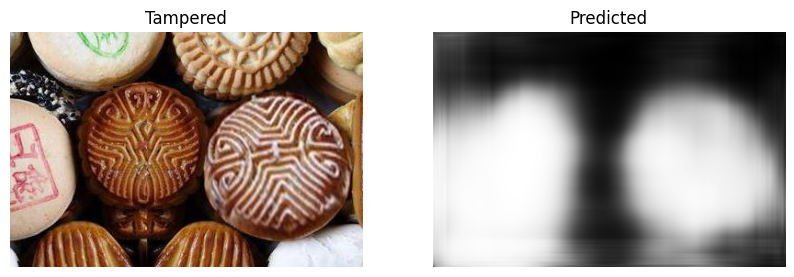

(256, 384, 1)
[INFO]: Epoch 102 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.216, training acc: 96.330
Validation loss: 0.836, validation acc: 88.651
Time =  9803.32584309578
--------------------------------------------------
[INFO]: Epoch 103 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.210, training acc: 96.639
Validation loss: 0.837, validation acc: 89.236
Time =  9909.952518939972
--------------------------------------------------
[INFO]: Epoch 104 of 300
Training
|||||||||||||||

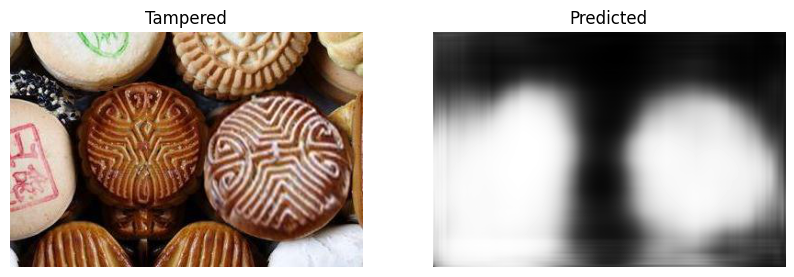

(256, 384, 1)
[INFO]: Epoch 112 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.197, training acc: 96.936
Validation loss: 0.838, validation acc: 89.531
Time =  10780.745533704758
--------------------------------------------------
[INFO]: Epoch 113 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.203, training acc: 96.823
Validation loss: 0.835, validation acc: 88.894
Time =  10881.612038373947
--------------------------------------------------
[INFO]: Epoch 114 of 300
Training
||||||||||||

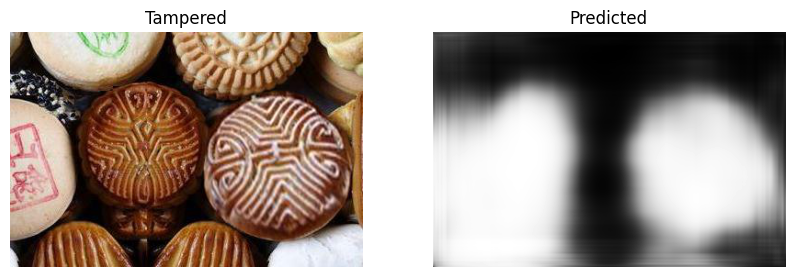

(256, 384, 1)
[INFO]: Epoch 122 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.185, training acc: 96.992
Validation loss: 0.836, validation acc: 89.047
Time =  11906.279254198074
--------------------------------------------------
[INFO]: Epoch 123 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.190, training acc: 96.903
Validation loss: 0.835, validation acc: 89.133
Time =  12053.209974527359
--------------------------------------------------
[INFO]: Epoch 124 of 300
Training
||||||||||||

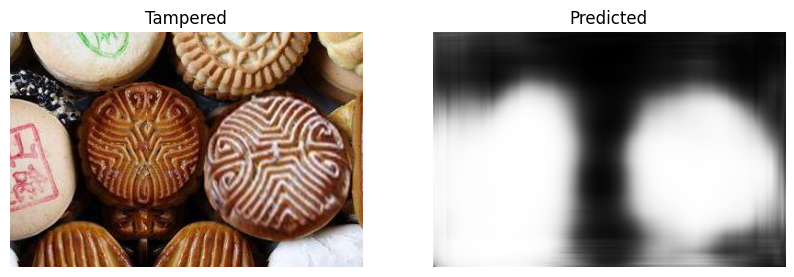

(256, 384, 1)
[INFO]: Epoch 132 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.176, training acc: 97.168
Validation loss: 0.836, validation acc: 88.240
Time =  13281.112759828568
--------------------------------------------------
[INFO]: Epoch 133 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.181, training acc: 97.093
Validation loss: 0.836, validation acc: 88.357
Time =  13419.880142688751
--------------------------------------------------
[INFO]: Epoch 134 of 300
Training
||||||||||||

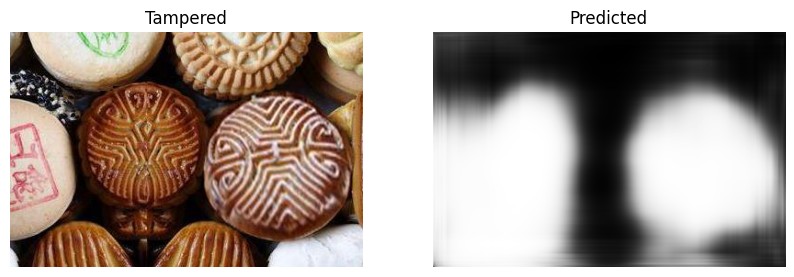

(256, 384, 1)
[INFO]: Epoch 142 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.176, training acc: 97.183
Validation loss: 0.833, validation acc: 88.613
Time =  14855.490270853043
--------------------------------------------------
[INFO]: Epoch 143 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.177, training acc: 97.286
Validation loss: 0.833, validation acc: 87.899
Time =  15016.81962966919
--------------------------------------------------
[INFO]: Epoch 144 of 300
Training
|||||||||||||

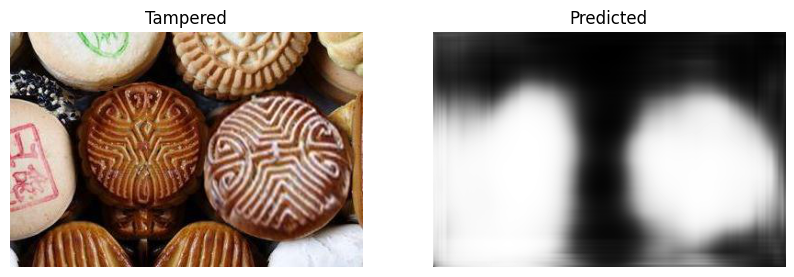

(256, 384, 1)
[INFO]: Epoch 152 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.170, training acc: 97.370
Validation loss: 0.838, validation acc: 89.201
Time =  16255.491297960281
--------------------------------------------------
[INFO]: Epoch 153 of 300
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.172, training acc: 97.364
Validation loss: 0.834, validation acc: 88.523
Time =  16373.518692970276
--------------------------------------------------
[INFO]: Epoch 154 of 300
Training
||||||||||||

In [ ]:
train_loss, valid_loss = [], []
train_acc, valid_acc = [], []
# Author ran for 50 Epochs
epochs = 300
since = time.time()
for epoch in range(epochs):
    if(epoch == 100):
        torch.save(model, "PyTorch_100Epoch_Acc.pth")
    print(f"[INFO]: Epoch {epoch+1} of {epochs}")
    train_epoch_loss, train_epoch_acc = train(model, train_loader,
                                              optimizer, dice_loss)
    valid_epoch_loss, valid_epoch_acc = validate(model, test_loader,
                                                 dice_loss)
    train_loss.append(train_epoch_loss)
    valid_loss.append(valid_epoch_loss)
    train_acc.append(train_epoch_acc)
    valid_acc.append(valid_epoch_acc)
    print()
    print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
    print(f"Validation loss: {valid_epoch_loss:.3f}, validation acc: {valid_epoch_acc:.3f}")
    print("Time = ", time.time() - since)
    print('-'*50)
    path = "CASIA2Dataset/tp/Tp_D_CND_M_N_art00077_art00076_10290.jpg"
    if epoch%10==0:
        display_prediction(path)
    scheduler.step()
time_elapsed = time.time() - since
print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

In [ ]:
torch.save(model, "PyTorch_300Epoch_Acc.pth")

In [ ]:
import torch
print(torch.__version__)

In [ ]:
model = torch.load("PyTorch_100Epoch_Acc.pth")
# loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.00001)

[INFO]: Epoch 1 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.220, training acc: 96.262
Validation loss: 0.836, validation acc: 89.936
Time =  117.8727514743805
--------------------------------------------------


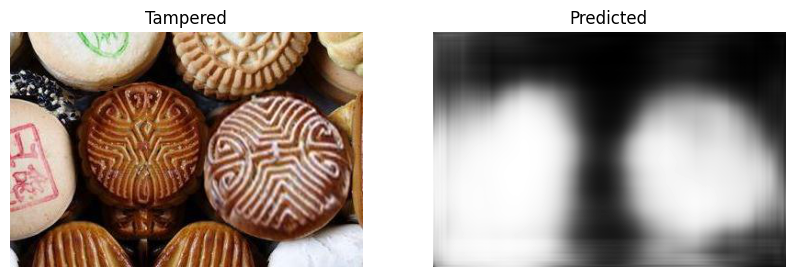

(256, 384, 1)
[INFO]: Epoch 2 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.212, training acc: 96.452
Validation loss: 0.837, validation acc: 88.880
Time =  221.2043616771698
--------------------------------------------------
[INFO]: Epoch 3 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.208, training acc: 96.618
Validation loss: 0.837, validation acc: 89.037
Time =  354.3627989292145
--------------------------------------------------
[INFO]: Epoch 4 of 100
Training
||||||||||||||||||||

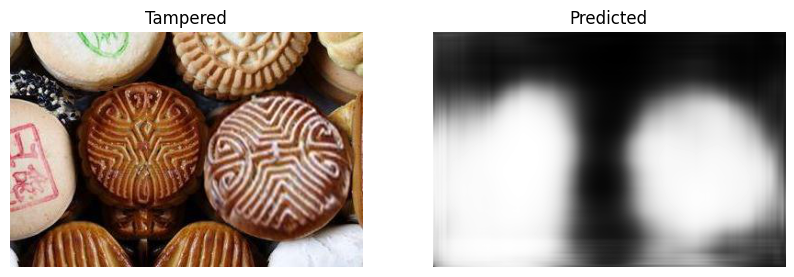

(256, 384, 1)
[INFO]: Epoch 12 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.198, training acc: 96.816
Validation loss: 0.834, validation acc: 88.785
Time =  1583.2992024421692
--------------------------------------------------
[INFO]: Epoch 13 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.198, training acc: 96.835
Validation loss: 0.836, validation acc: 88.012
Time =  1732.1725273132324
--------------------------------------------------
[INFO]: Epoch 14 of 100
Training
|||||||||||||||

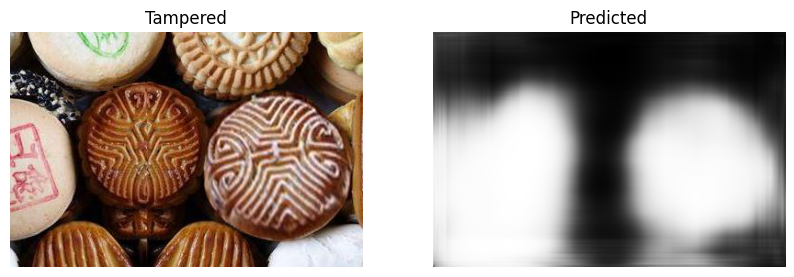

(256, 384, 1)
[INFO]: Epoch 22 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.186, training acc: 97.003
Validation loss: 0.833, validation acc: 87.927
Time =  3165.135097026825
--------------------------------------------------
[INFO]: Epoch 23 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.192, training acc: 96.883
Validation loss: 0.834, validation acc: 88.339
Time =  3328.101776599884
--------------------------------------------------
[INFO]: Epoch 24 of 100
Training
|||||||||||||||||

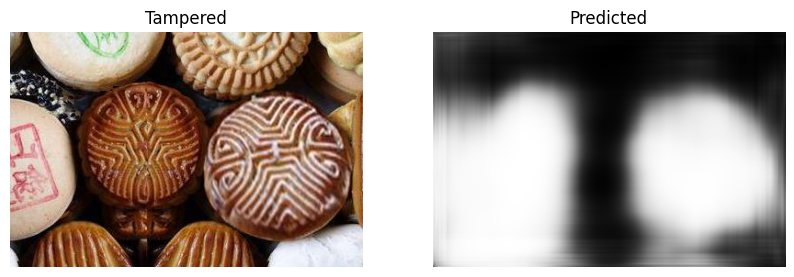

(256, 384, 1)
[INFO]: Epoch 32 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.180, training acc: 97.108
Validation loss: 0.838, validation acc: 89.550
Time =  4819.530299425125
--------------------------------------------------
[INFO]: Epoch 33 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.180, training acc: 97.134
Validation loss: 0.834, validation acc: 86.735
Time =  4993.917779684067
--------------------------------------------------
[INFO]: Epoch 34 of 100
Training
|||||||||||||||||

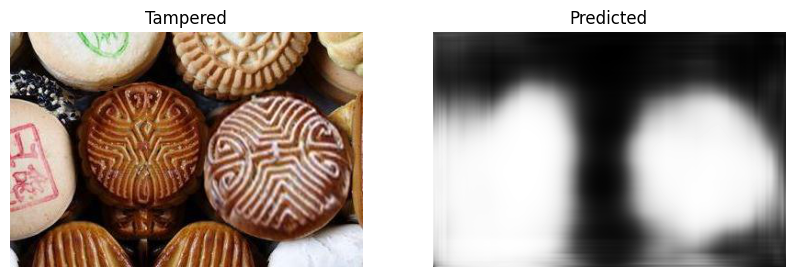

(256, 384, 1)
[INFO]: Epoch 42 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.177, training acc: 97.206
Validation loss: 0.834, validation acc: 86.960
Time =  6576.005441904068
--------------------------------------------------
[INFO]: Epoch 43 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.181, training acc: 97.160
Validation loss: 0.836, validation acc: 87.946
Time =  6755.938435554504
--------------------------------------------------
[INFO]: Epoch 44 of 100
Training
|||||||||||||||||

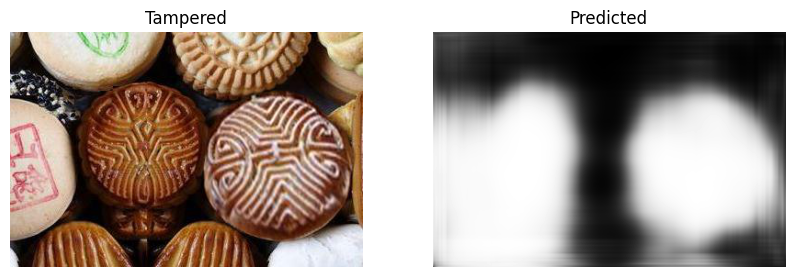

(256, 384, 1)
[INFO]: Epoch 52 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.172, training acc: 97.356
Validation loss: 0.838, validation acc: 89.381
Time =  8229.409015417099
--------------------------------------------------
[INFO]: Epoch 53 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.175, training acc: 97.299
Validation loss: 0.835, validation acc: 89.032
Time =  8576.949961900711
--------------------------------------------------
[INFO]: Epoch 54 of 100
Training
|||||||||||||||||

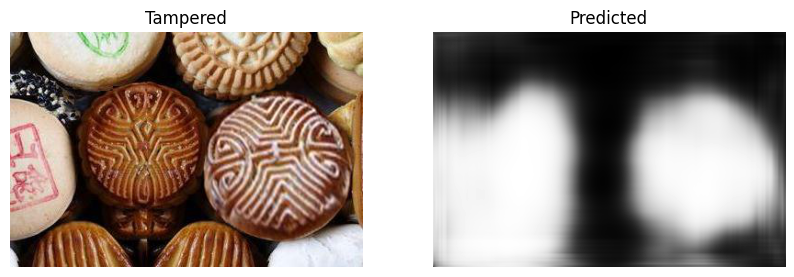

(256, 384, 1)
[INFO]: Epoch 62 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.165, training acc: 97.544
Validation loss: 0.837, validation acc: 88.344
Time =  10056.860373020172
--------------------------------------------------
[INFO]: Epoch 63 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.175, training acc: 97.321
Validation loss: 0.833, validation acc: 88.112
Time =  10225.946612596512
--------------------------------------------------
[INFO]: Epoch 64 of 100
Training
|||||||||||||||

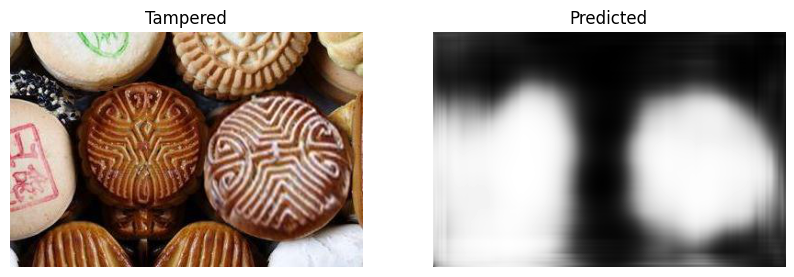

(256, 384, 1)
[INFO]: Epoch 72 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.163, training acc: 97.534
Validation loss: 0.836, validation acc: 87.824
Time =  11444.87167930603
--------------------------------------------------
[INFO]: Epoch 73 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.160, training acc: 97.521
Validation loss: 0.835, validation acc: 86.269
Time =  11571.2977643013
--------------------------------------------------
[INFO]: Epoch 74 of 100
Training
||||||||||||||||||

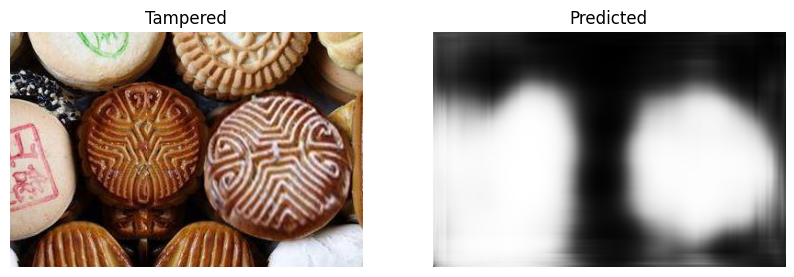

(256, 384, 1)
[INFO]: Epoch 82 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.155, training acc: 97.531
Validation loss: 0.836, validation acc: 88.967
Time =  12668.85032081604
--------------------------------------------------
[INFO]: Epoch 83 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.159, training acc: 97.627
Validation loss: 0.836, validation acc: 86.466
Time =  12757.95319533348
--------------------------------------------------
[INFO]: Epoch 84 of 100
Training
|||||||||||||||||

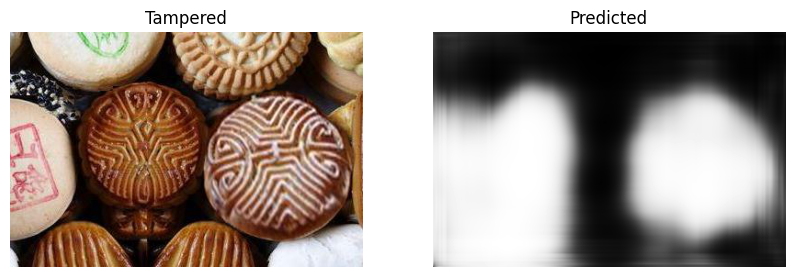

(256, 384, 1)
[INFO]: Epoch 92 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.152, training acc: 97.645
Validation loss: 0.836, validation acc: 87.398
Time =  15113.798770427704
--------------------------------------------------
[INFO]: Epoch 93 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.152, training acc: 97.650
Validation loss: 0.834, validation acc: 86.166
Time =  15438.22605752945
--------------------------------------------------
[INFO]: Epoch 94 of 100
Training
||||||||||||||||

In [ ]:
train_loss, valid_loss = [], []
train_acc, valid_acc = [], []
# Author ran for 50 Epochs
epochs = 100
since = time.time()
for epoch in range(epochs):
#     if(epoch == 100):
#         torch.save(model, "PyTorch_100Epoch_Acc.pth")
    print(f"[INFO]: Epoch {epoch+1} of {epochs}")
    train_epoch_loss, train_epoch_acc = train(model, train_loader,
                                              optimizer, dice_loss)
    valid_epoch_loss, valid_epoch_acc = validate(model, test_loader,
                                                 dice_loss)
    train_loss.append(train_epoch_loss)
    valid_loss.append(valid_epoch_loss)
    train_acc.append(train_epoch_acc)
    valid_acc.append(valid_epoch_acc)
    print()
    print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
    print(f"Validation loss: {valid_epoch_loss:.3f}, validation acc: {valid_epoch_acc:.3f}")
    print("Time = ", time.time() - since)
    print('-'*50)
    path = "CASIA2Dataset/tp/Tp_D_CND_M_N_art00077_art00076_10290.jpg"
    if epoch%10==0:
        display_prediction(path)
#     scheduler.step()
time_elapsed = time.time() - since
print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

In [ ]:
torch.save(model, "PyTorch_200Epoch_Acc.pth")

In [ ]:
ls CASIA2Dataset/tp

Tp_D_CND_M_N_ani00018_sec00096_00138.jpg
Tp_D_CND_M_N_art00076_art00077_10289.jpg
Tp_D_CND_M_N_art00077_art00076_10290.jpg
Tp_D_CND_S_N_ani00073_ani00068_00193.jpg
Tp_D_CND_S_N_ind00078_ind00077_00476.jpg
Tp_D_CND_S_N_txt00028_txt00006_10848.jpg
Tp_D_CNN_M_B_nat00056_nat00099_11105.jpg
Tp_D_CNN_M_B_nat10139_nat00059_11949.jpg
Tp_D_CNN_M_B_nat10139_nat00097_11948.jpg
Tp_D_CNN_M_N_ani00023_ani00024_10205.jpg
Tp_D_CNN_M_N_ani00052_ani00054_11130.jpg
Tp_D_CNN_M_N_ani00057_ani00055_11149.jpg
Tp_D_CNN_M_N_art00052_arc00030_11853.jpg
Tp_D_CNN_M_N_cha00026_cha00028_11784.jpg
Tp_D_CNN_M_N_nat00013_cha00042_11093.jpg
Tp_D_CNN_M_N_nat00041_nat10123_11439.jpg
Tp_D_CNN_M_N_nat00089_nat00062_10577.jpg
Tp_D_CNN_M_N_nat10139_nat00095_11947.jpg
Tp_D_CNN_M_N_nat10156_ani00024_12016.jpg
Tp_D_CNN_M_N_sec00011_cha00085_11227.jpg
Tp_D_CNN_M_N_sec10107_sec10101_10299.jpg
Tp_D_CNN_M_N_sec10110_sec10101_10298.jpg
Tp_D_CNN_M_N_txt00049_txt00050_10374.jpg
Tp_D_CNN_M_N_txt00054_txt00050_10375.jpg
Tp_D_CNN_M_N_txt

In [ ]:
model = torch.load("PyTorch_200Epoch_Acc.pth")
# loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.00001)

[INFO]: Epoch 1 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.155, training acc: 97.705
Validation loss: 0.838, validation acc: 89.342
Time =  36.169058084487915
--------------------------------------------------


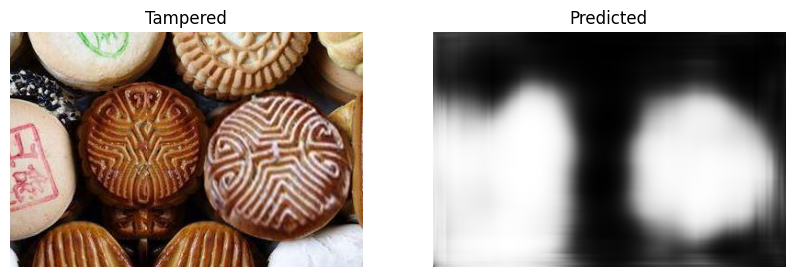

(256, 384, 1)
[INFO]: Epoch 2 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.145, training acc: 97.742
Validation loss: 0.834, validation acc: 88.314
Time =  94.21648263931274
--------------------------------------------------
[INFO]: Epoch 3 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.150, training acc: 97.647
Validation loss: 0.836, validation acc: 87.922
Time =  178.3073809146881
--------------------------------------------------
[INFO]: Epoch 4 of 100
Training
||||||||||||||||||||

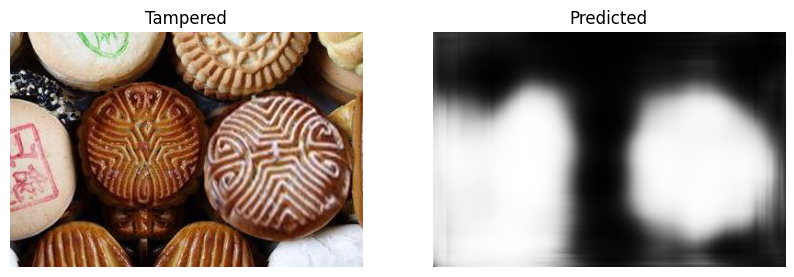

(256, 384, 1)
[INFO]: Epoch 12 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.146, training acc: 97.769
Validation loss: 0.838, validation acc: 88.969
Time =  732.9670262336731
--------------------------------------------------
[INFO]: Epoch 13 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.143, training acc: 97.845
Validation loss: 0.838, validation acc: 88.184
Time =  804.1188662052155
--------------------------------------------------
[INFO]: Epoch 14 of 100
Training
|||||||||||||||||

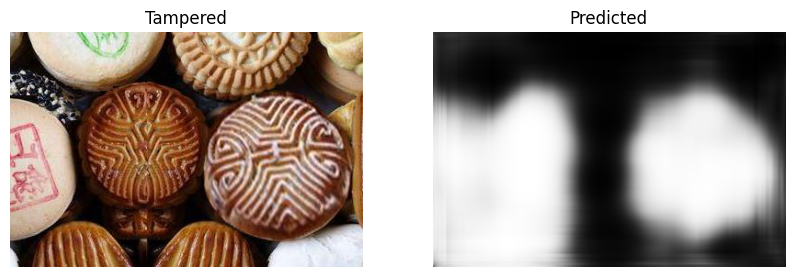

(256, 384, 1)
[INFO]: Epoch 22 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.145, training acc: 97.859
Validation loss: 0.838, validation acc: 87.188
Time =  1436.2331018447876
--------------------------------------------------
[INFO]: Epoch 23 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.145, training acc: 97.814
Validation loss: 0.837, validation acc: 86.913
Time =  1492.9291107654572
--------------------------------------------------
[INFO]: Epoch 24 of 100
Training
|||||||||||||||

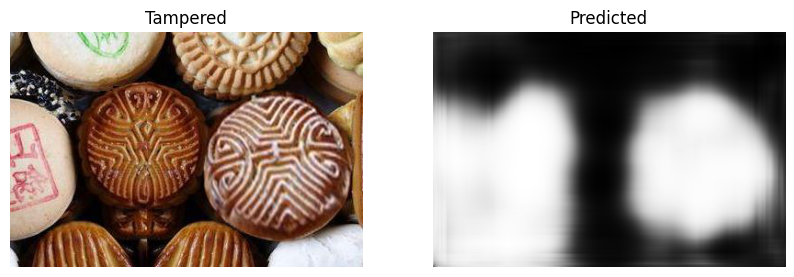

(256, 384, 1)
[INFO]: Epoch 32 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.139, training acc: 97.905
Validation loss: 0.839, validation acc: 88.534
Time =  2003.9380657672882
--------------------------------------------------
[INFO]: Epoch 33 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.141, training acc: 97.863
Validation loss: 0.839, validation acc: 86.980
Time =  2055.2928013801575
--------------------------------------------------
[INFO]: Epoch 34 of 100
Training
|||||||||||||||

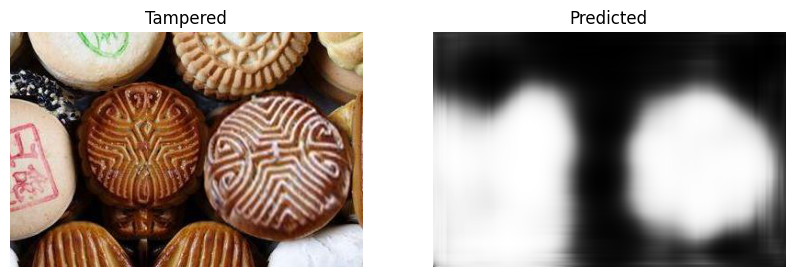

(256, 384, 1)
[INFO]: Epoch 42 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.139, training acc: 97.785
Validation loss: 0.842, validation acc: 86.963
Time =  2538.4521484375
--------------------------------------------------
[INFO]: Epoch 43 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.137, training acc: 97.881
Validation loss: 0.841, validation acc: 88.507
Time =  2591.1143560409546
--------------------------------------------------
[INFO]: Epoch 44 of 100
Training
||||||||||||||||||

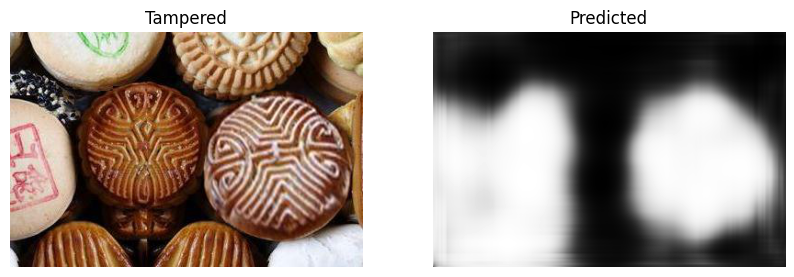

(256, 384, 1)
[INFO]: Epoch 52 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.134, training acc: 97.937
Validation loss: 0.837, validation acc: 87.366
Time =  3092.5147466659546
--------------------------------------------------
[INFO]: Epoch 53 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.131, training acc: 98.055
Validation loss: 0.836, validation acc: 87.020
Time =  3150.463440179825
--------------------------------------------------
[INFO]: Epoch 54 of 100
Training
||||||||||||||||

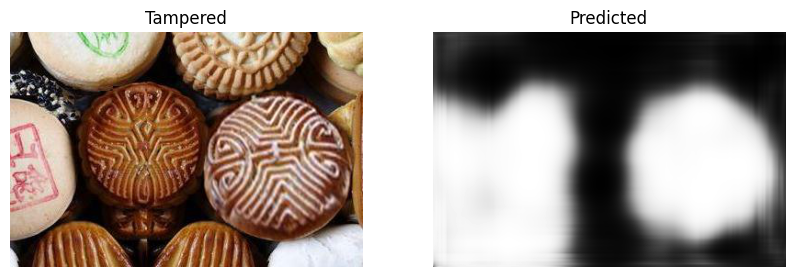

(256, 384, 1)
[INFO]: Epoch 62 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.135, training acc: 98.002
Validation loss: 0.840, validation acc: 85.422
Time =  3702.8776376247406
--------------------------------------------------
[INFO]: Epoch 63 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.131, training acc: 98.079
Validation loss: 0.839, validation acc: 87.360
Time =  3762.2441663742065
--------------------------------------------------
[INFO]: Epoch 64 of 100
Training
|||||||||||||||

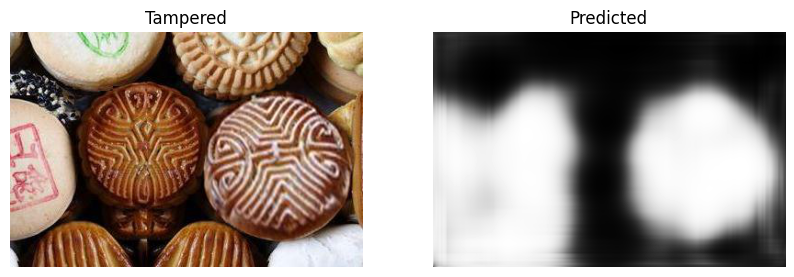

(256, 384, 1)
[INFO]: Epoch 72 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.130, training acc: 98.078
Validation loss: 0.839, validation acc: 87.317
Time =  4230.254689455032
--------------------------------------------------
[INFO]: Epoch 73 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.125, training acc: 98.087
Validation loss: 0.839, validation acc: 87.468
Time =  4290.96843957901
--------------------------------------------------
[INFO]: Epoch 74 of 100
Training
||||||||||||||||||

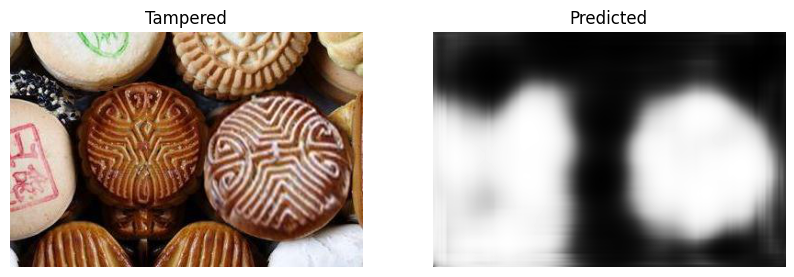

(256, 384, 1)
[INFO]: Epoch 82 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.128, training acc: 98.087
Validation loss: 0.840, validation acc: 86.258
Time =  4790.401111125946
--------------------------------------------------
[INFO]: Epoch 83 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.129, training acc: 97.995
Validation loss: 0.840, validation acc: 86.811
Time =  4852.71226477623
--------------------------------------------------
[INFO]: Epoch 84 of 100
Training
||||||||||||||||||

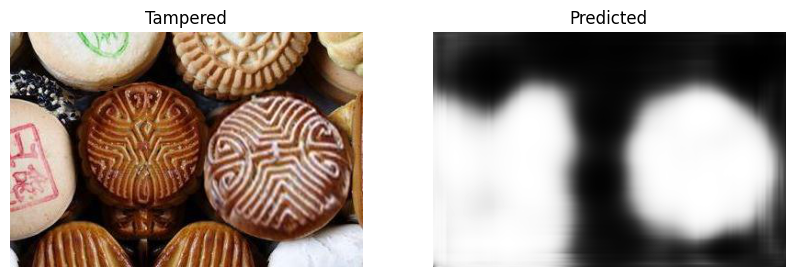

(256, 384, 1)
[INFO]: Epoch 92 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.122, training acc: 98.107
Validation loss: 0.840, validation acc: 88.093
Time =  5369.31206536293
--------------------------------------------------
[INFO]: Epoch 93 of 100
Training
||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||+++++++++++++++++++++++++
Training loss: 0.128, training acc: 98.118
Validation loss: 0.843, validation acc: 89.406
Time =  5418.542447566986
--------------------------------------------------
[INFO]: Epoch 94 of 100
Training
||||||||||||||||||

In [ ]:
train_loss, valid_loss = [], []
train_acc, valid_acc = [], []
# Author ran for 50 Epochs
epochs = 100
since = time.time()
for epoch in range(epochs):
    if(epoch == 50):
        torch.save(model, "PyTorch_250Epoch_Acc.pth")
    print(f"[INFO]: Epoch {epoch+1} of {epochs}")
    train_epoch_loss, train_epoch_acc = train(model, train_loader,
                                              optimizer, dice_loss)
    valid_epoch_loss, valid_epoch_acc = validate(model, test_loader,
                                                 dice_loss)
    train_loss.append(train_epoch_loss)
    valid_loss.append(valid_epoch_loss)
    train_acc.append(train_epoch_acc)
    valid_acc.append(valid_epoch_acc)
    print()
    print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
    print(f"Validation loss: {valid_epoch_loss:.3f}, validation acc: {valid_epoch_acc:.3f}")
    print("Time = ", time.time() - since)
    print('-'*50)
    path = "CASIA2Dataset/tp/Tp_D_CND_M_N_art00077_art00076_10290.jpg"
    if epoch%10==0:
        display_prediction(path)
#     scheduler.step()
time_elapsed = time.time() - since
print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

In [ ]:
torch.save(model, "PyTorch_300Epoch_Acc.pth")

In [ ]:
print("sdf'as'")

sdf'as'


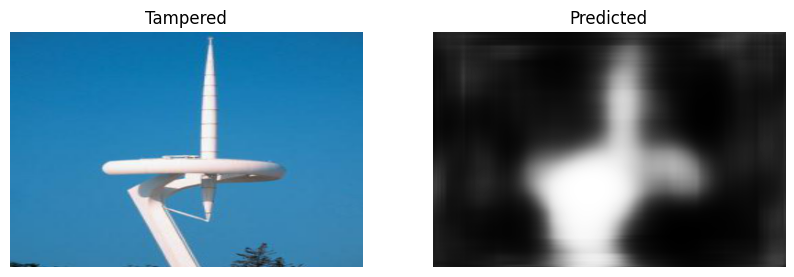

(256, 384, 1)


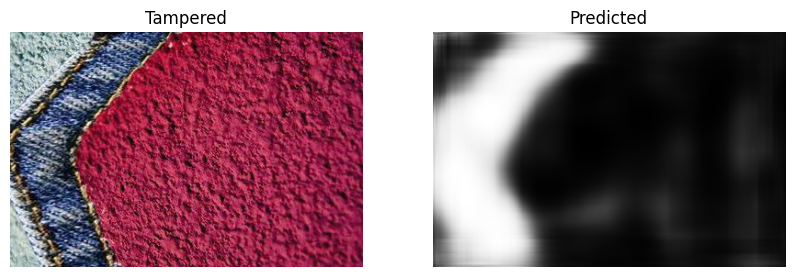

(256, 384, 1)


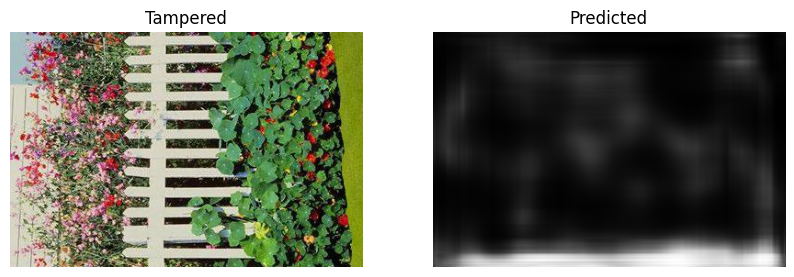

(256, 384, 1)


In [ ]:
path = ["CASIA2Dataset/tp/Tp_S_NNN_S_N_art00028_art00028_20120.jpg",
       "CASIA2Dataset/tp/Tp_D_CND_S_N_txt00028_txt00006_10848.jpg",
       "CASIA2Dataset/tp/Tp_D_CNN_M_N_sec00011_cha00085_11227.jpg"]
# plt.imshow(plt.imread("CASIA2Dataset/gt/Tp_S_NNN_S_N_art00028_art00028_20120_gt.png"), cmap='gray')
for i in path:
    display_prediction(i)

In [11]:
import cv2

def morphological_opening(image, kernel_size):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    opened_image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    return opened_image


In [25]:
from torchcrf import CRF

def FCRF(output):# Assuming 'output' is a 4D tensor (batch_size, channels, height, width) containing logits
    outputs = output

    # Move data to desired device (CPU or GPU)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    outputs = outputs.to(device)

    # Convert logits to probabilities (optional, depending on CRF requirement)
    probabilities = torch.nn.functional.softmax(outputs, dim=1)

    # Define CRF parameters
    num_classes = probabilities.shape[1]  # Get number of classes from probabilities

    # Create CRF instance
    crf = CRF(num_classes, 
    # unary_potential=probabilities
    )

    # Define features (replace with your specific features)
    # This example uses simple Gaussian smoothing features
    features = torch.ones_like(probabilities)  # Placeholder for features
    # ... (Implement your feature extraction logic here)

    # Decode using CRF
    mask = crf(features, probabilities)  # Decode using CRF with features and probabilities

    # Move data back to CPU (optional)
    mask = mask.cpu()

    # Use the decoded mask for further processing or visualization
    print(mask.shape)  # Output will be (batch_size, height, width) containing class labels

    return mask


In [15]:
tModel = torch.load("PyTorch_300Epoch_Acc.pth", map_location=torch.device('cpu') )

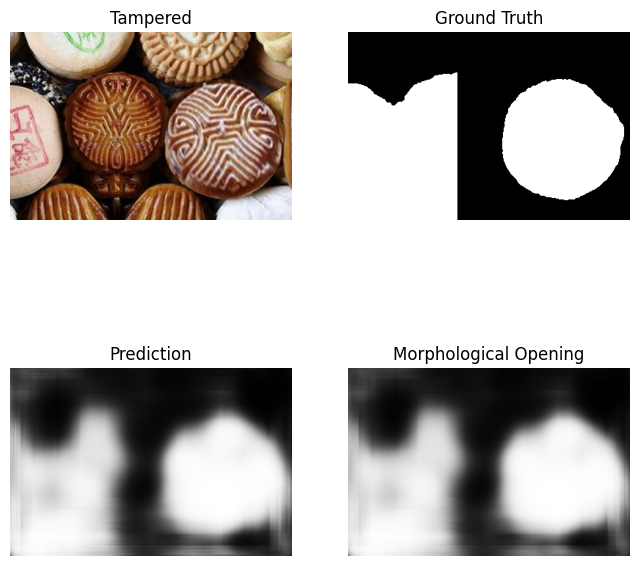

In [23]:
img_name = "Tp_D_CND_M_N_art00077_art00076_10290"
img = plt.imread(f"C:\\Users\\hp\\Downloads\\CASIA_PNG\\tp\\{img_name}.png")
img_gt = plt.imread(f"C:\\Users\\hp\\Downloads\\CASIA_PNG\\gt\\{img_name}_gt.png")
img = transform(img)
residual = sobel(img.unsqueeze(axis=0))
o = output = tModel(img.unsqueeze(axis=(0)), residual)
output = output.squeeze(axis=0).permute(1, 2, 0).detach().numpy()

opened_image = morphological_opening(output, kernel_size=5)


fig, axs = plt.subplots(2, 2, figsize=(8, 8))

axs[0][0].imshow(img.permute(1, 2, 0))
axs[0][0].set_title("Tampered")
axs[0][0].axis("off")

axs[0][1].imshow(img_gt, cmap="gray")
axs[0][1].set_title("Ground Truth")
axs[0][1].axis("off")

axs[1][0].imshow(output, cmap="gray")
axs[1][0].set_title("Prediction")
axs[1][0].axis("off")

axs[1][1].imshow(opened_image, cmap="gray")
axs[1][1].set_title("Morphological Opening")
axs[1][1].axis("off")

plt.show()


In [34]:
print(o.shape)
imageout = FCRF(o.squeeze(axis=0))
plt.imshow(imageout, cmap="gray")

torch.Size([1, 1, 256, 384])


ValueError: expected last dimension of emissions is 256, got 384